In [166]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random


PREVENT RANDOMNESS

In [167]:
np.random.seed(21)

In [168]:
df = pd.read_csv("winequality-red.csv")

In [169]:
X = df.iloc[:,0:11]

In [170]:
y = df["quality"].copy()
X = df.iloc[:,0:11]

In [171]:
X

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [172]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [173]:
from sklearn import model_selection

In [174]:
x_train , x_test, y_train, y_test = model_selection.train_test_split(X,y,test_size=0.2)

In [175]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


EDA

In [176]:
df.rename(columns = {"fixed acidity": "fixed_acidity", "volatile acidity": "volatile_acidity",
                    "citric acid": "citric_acid", "residual sugar": "residual_sugar",
                    "chlorides": "chlorides", "free sulfur dioxide": "free_sulfur_dioxide",
                    "total sulfur dioxide": "total_sulfur_dioxide"}, inplace = True)

In [177]:
len(df.columns)

12

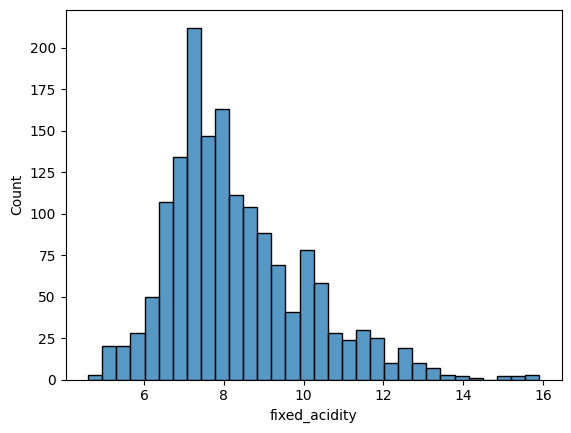

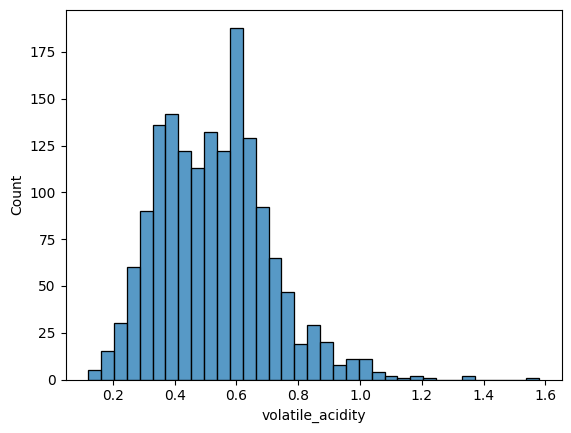

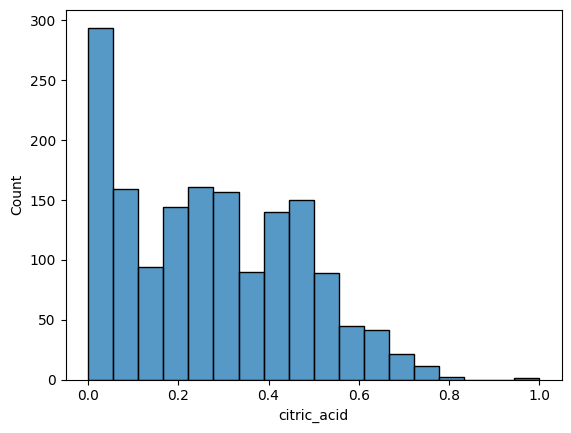

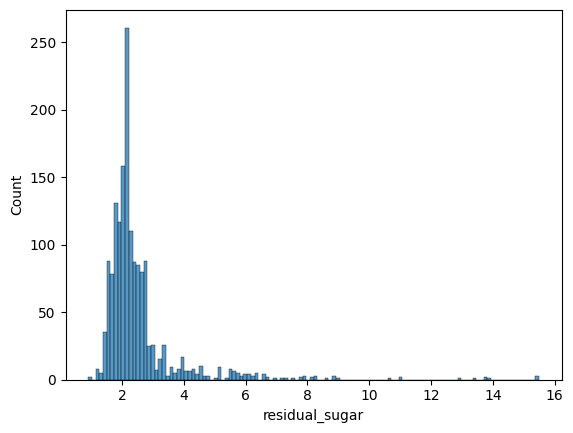

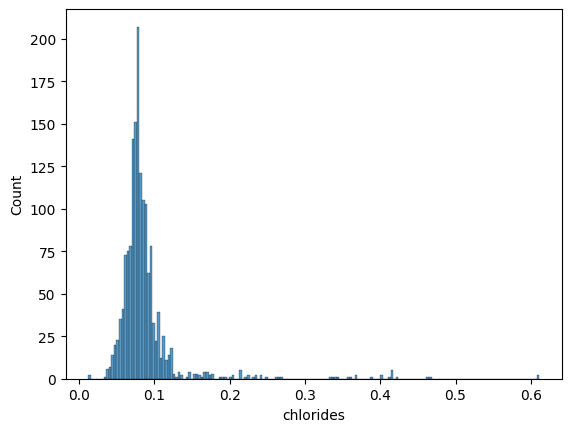

...

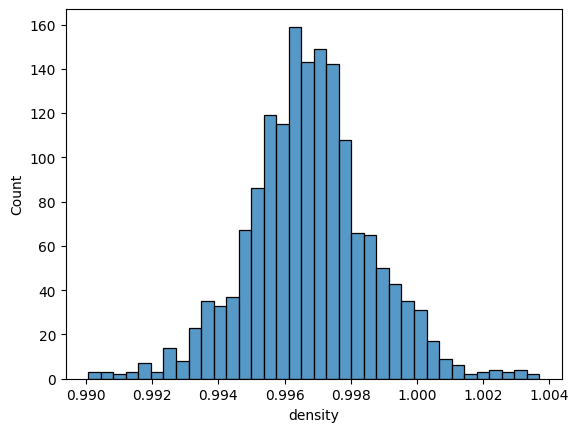

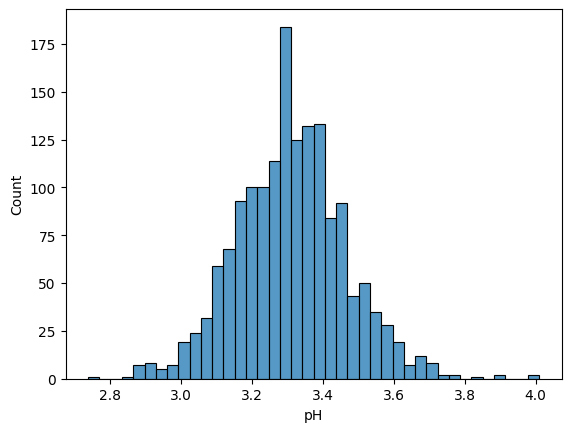

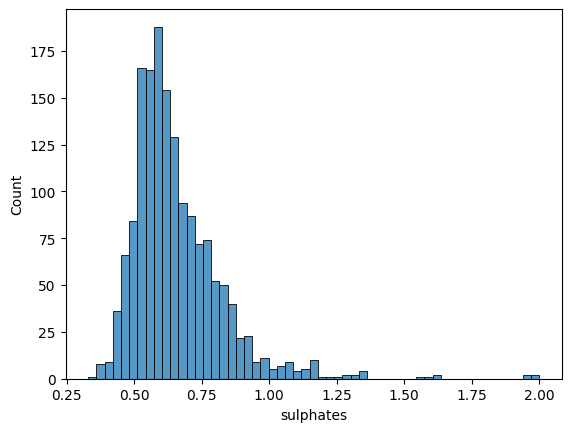

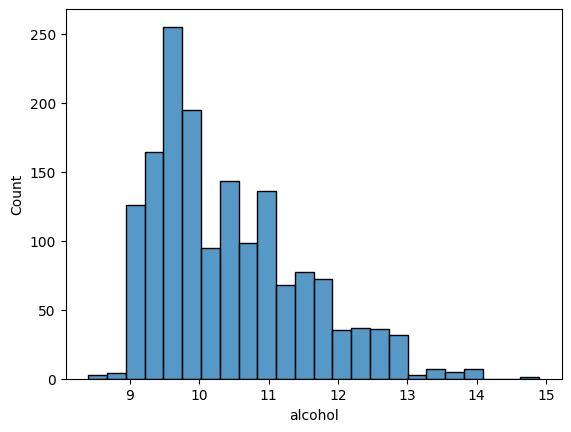

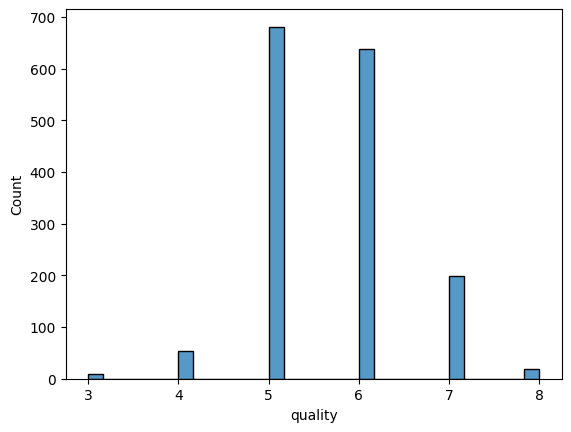

In [178]:

for idx,column_name in enumerate(df.columns):
    plt.figure(idx)
    sns.histplot(x=column_name,data=df)

<Axes: xlabel='fixed_acidity', ylabel='Count'>

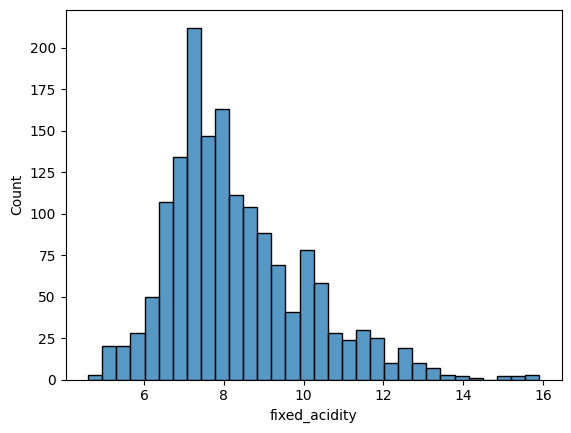

In [179]:
sns.histplot(x = df["fixed_acidity"])

Descriptive Statistics

In [180]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         1599 non-null   float64
 1   volatile_acidity      1599 non-null   float64
 2   citric_acid           1599 non-null   float64
 3   residual_sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free_sulfur_dioxide   1599 non-null   float64
 6   total_sulfur_dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [181]:
df.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [182]:
df.isnull().sum()

fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

1▪ Data Visualization

HISTOGRAM OF ALCOHOL, RESIDIUAL SUGAR AND CHLORIDES

[Text(0.5, 1.0, "Distribution of 'chlorides'")]

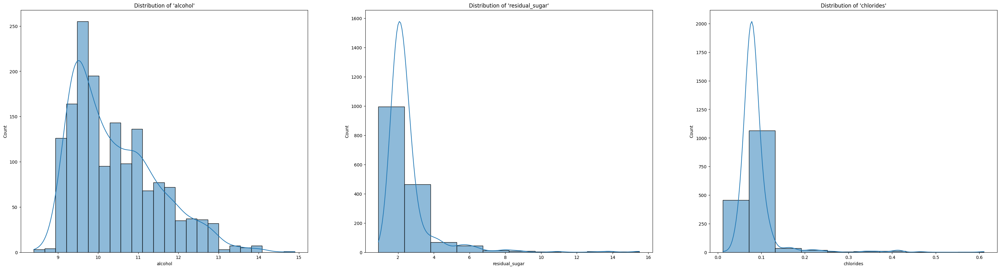

In [183]:
fig, axes = plt.subplots(1, 3, figsize=(40, 10))

sns.histplot(ax = axes[0], x = df["alcohol"],   
             kde = True,).set(title = "Distribution of 'alcohol'")

sns.histplot(ax = axes[1], x = df["residual_sugar"],
             bins = 10,
             kde = True,
             cbar = True,).set(title = "Distribution of 'residual_sugar'")

sns.histplot(ax = axes[2], x = df["chlorides"],
             bins = 10,
             kde = True,   
             cbar = True,).set(title = "Distribution of 'chlorides'")

[Text(0.5, 1.0, "Distribution of 'citric_acid'")]

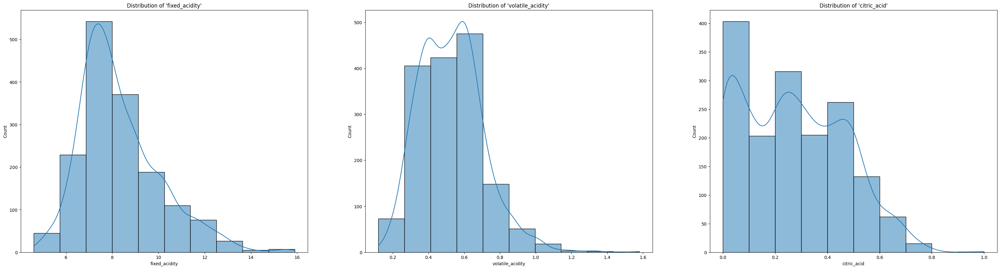

In [184]:
fig, axes = plt.subplots(1, 3, figsize = (40, 10))

sns.histplot(ax = axes[0], x = df["fixed_acidity"],
             bins = 10,
             kde = True,
             cbar = True,
             ).set(title = "Distribution of 'fixed_acidity'")

sns.histplot(ax = axes[1], x = df["volatile_acidity"],
             bins = 10,
             cbar = True,
             kde = True,
             ).set(title = "Distribution of 'volatile_acidity'")

sns.histplot(ax = axes[2], x = df["citric_acid"],
             bins = 10,
             kde = True,   
             cbar = True,
             ).set(title = "Distribution of 'citric_acid'")

PAIRPLOT

In [185]:
# sns.pairplot(df, diag_kind = "hist", hue = "quality", height = 3, aspect = 1.2, corner = True)

SCATTER PLOTS OF SOME FEATURES WITH TARGET VARIABLE

[Text(0.5, 1.0, "Relationship between 'density' and 'quality'")]

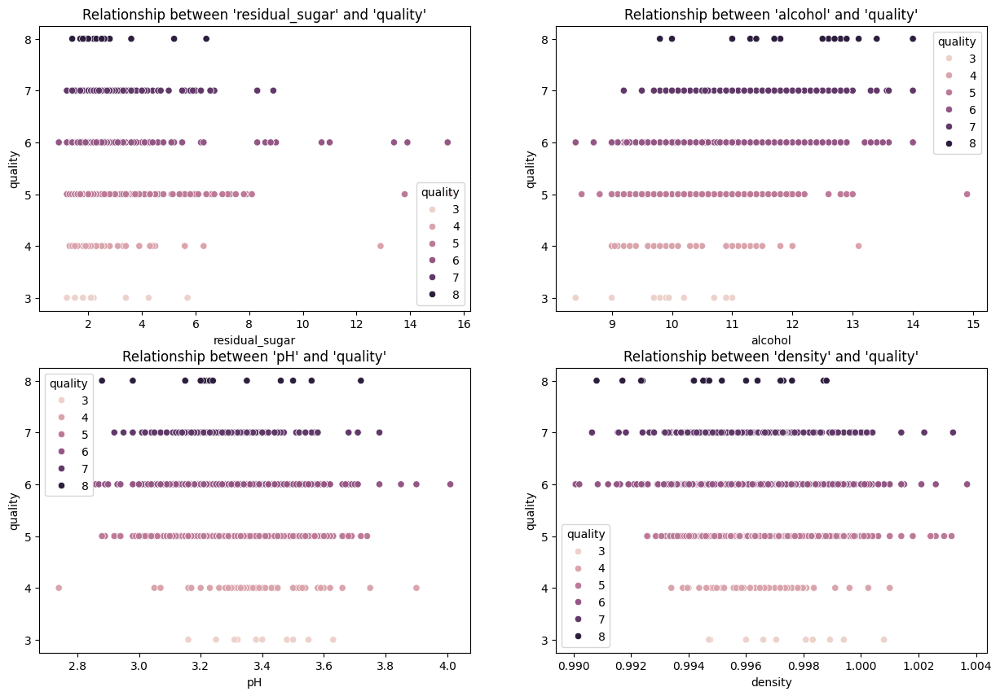

In [186]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

sns.scatterplot(ax = axes[0],
                x = "residual_sugar",
                y = "quality", hue = "quality",
                data = df).set(title = "Relationship between 'residual_sugar' and 'quality'")

sns.scatterplot(ax = axes[1],
                x = "alcohol",
                y = "quality", hue = "quality",
                data = df).set(title = "Relationship between 'alcohol' and 'quality'")

sns.scatterplot(ax = axes[2],
                x = "pH",
                y = "quality", hue = "quality",
                data = df).set(title = "Relationship between 'pH' and 'quality'")
sns.scatterplot(ax = axes[3],
                x = "density",
                y = "quality", hue = "quality",
                data = df).set(title = "Relationship between 'density' and 'quality'")

CORRELATION MATRIX

<Axes: >

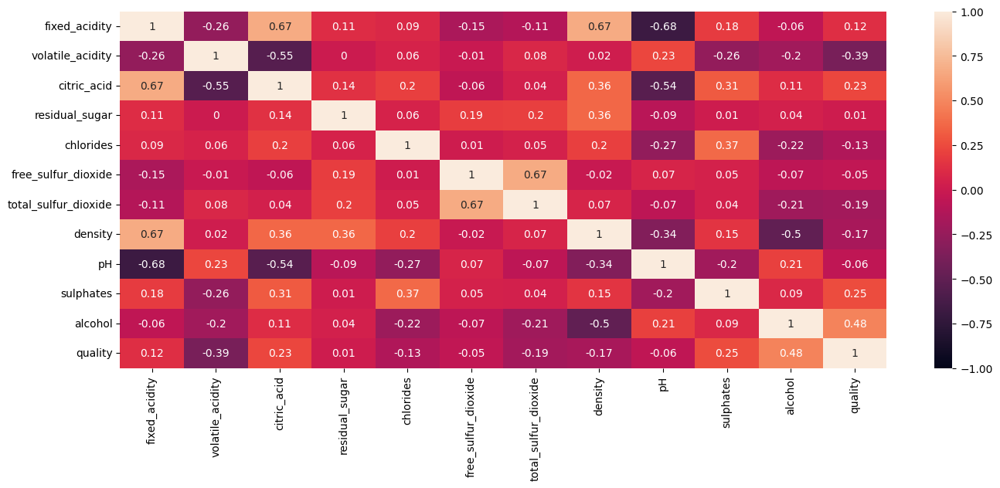

In [187]:
# Increase the size of the heatmap.
plt.figure(figsize=(16, 6))
sns.heatmap(df.corr().round(decimals=2),annot=True,vmin=-1, vmax=1)

BOX PLOTS OF ATTRIBUTES

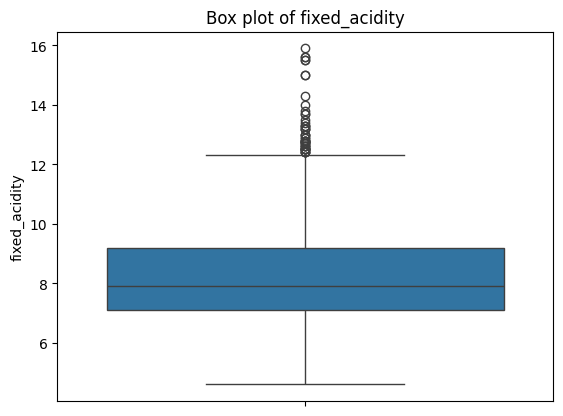

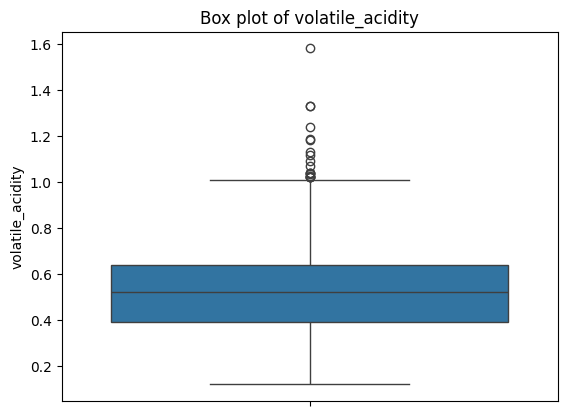

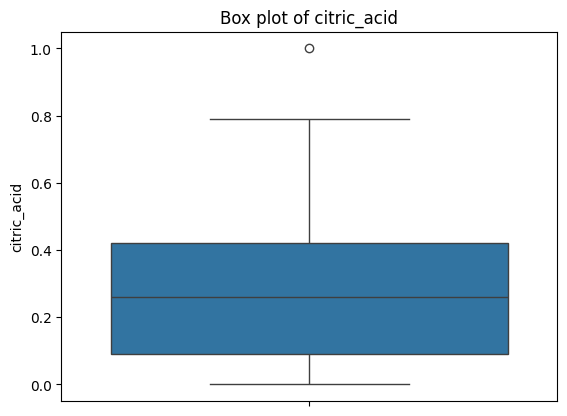

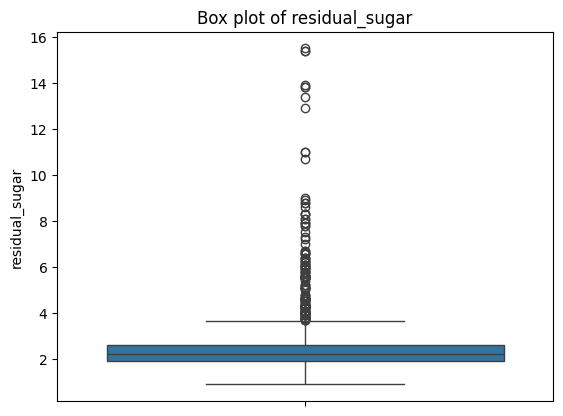

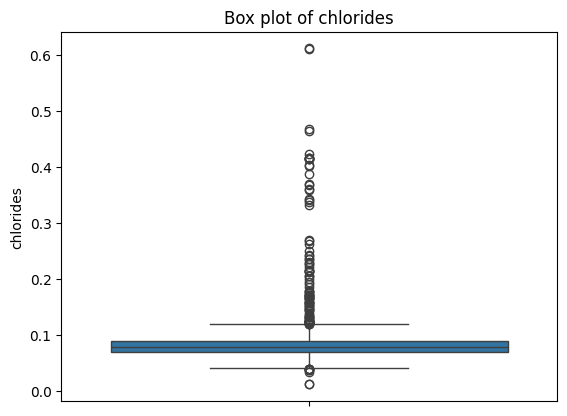

...

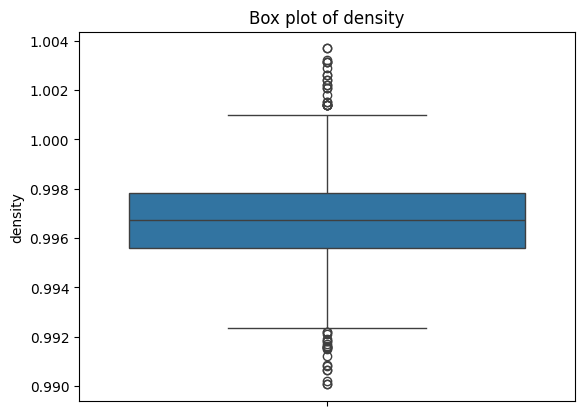

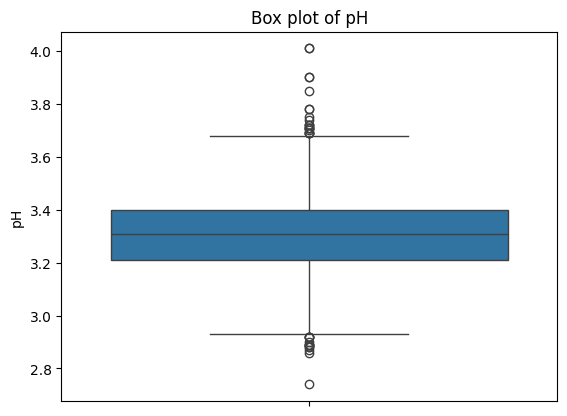

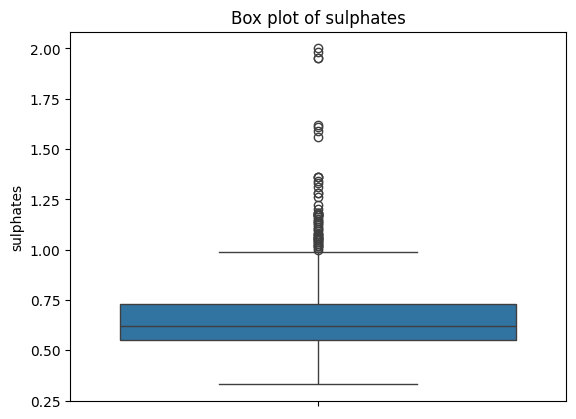

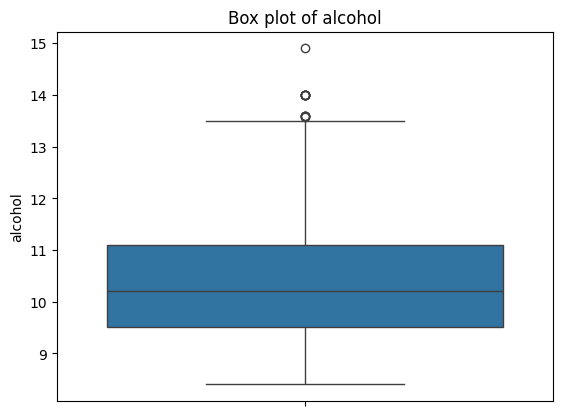

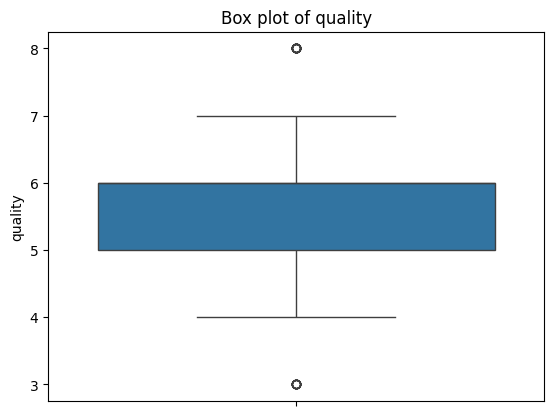

In [188]:
# plt.figure(figsize=(20, 12))
for index, column in enumerate(df.columns):
    sns.boxplot(df[column])
    plt.title(f"Box plot of {df.columns[index]}")
    plt.show()


#PASS

2▪ Data Preprocessing

🔺 Imputing

As we can see, there are no null values in the dataset so we will not preform imputing on this dataset

In [189]:
df.isnull().sum()

fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

🔺 Outlier Handling

1. LOF - ISOLATION FOREST

In [190]:
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

In [191]:
iso_forest = IsolationForest(random_state=0)
iso_forest.fit(X)

IsolationForest(random_state=0)

In [192]:
lof = LocalOutlierFactor()

In [193]:
outliers_iso = iso_forest.predict(X)
outliers_iso

array([1, 1, 1, ..., 1, 1, 1])

In [194]:
outliers_lof = lof.fit_predict(X)
outliers_lof

array([1, 1, 1, ..., 1, 1, 1])

In [195]:
print("Outliers detected by Isolation Forest:",len([outliers for outliers in outliers_iso if outliers == -1]))
print("Outliers detected by LOF:",len([outliers for outliers in outliers_lof if outliers == -1]))

Outliers detected by Isolation Forest: 140
Outliers detected by LOF: 33


In [196]:
outliers_intersection = list()
outliers_intersection_idx = list()
for i in range(len(outliers_lof)):
    if outliers_lof[i] == -1 and outliers_iso[i] == -1:
        outliers_intersection.append(outliers_iso[i])
        outliers_intersection_idx.append(i)
print("Outliers detected by intersection of LOF and Isolation forest",len(outliers_intersection))
print("Indexes of outliers detected by intersection of LOF and Isolation forest",outliers_intersection_idx)

Outliers detected by intersection of LOF and Isolation forest 23
Indexes of outliers detected by intersection of LOF and Isolation forest [324, 325, 354, 374, 396, 400, 442, 444, 480, 538, 559, 564, 652, 1079, 1081, 1131, 1186, 1235, 1244, 1434, 1435, 1558, 1574]


In [197]:
X.drop(outliers_intersection_idx,axis="index",inplace=True)
y.drop(outliers_intersection_idx,axis="index",inplace=True)

In [198]:
X.shape

(1576, 11)

In [199]:
y.shape

(1576,)

2. IQR Method

In [200]:
for idx , i in enumerate(df):
    print(idx,i)

0 fixed_acidity
1 volatile_acidity
2 citric_acid
3 residual_sugar
4 chlorides
5 free_sulfur_dioxide
6 total_sulfur_dioxide
7 density
8 pH
9 sulphates
10 alcohol
11 quality


In [201]:

# Function do detect outliers with IQR method (Points below and above upper and lower bounds)
def handle_outliers(df):
    for column in df:
        sns.boxplot(df[column])
        plt.title(f"Box plot of {column} before outlier handling")
        plt.show()
        data = sorted(df[column])
        q1 = np.percentile(data, 25)
        q3 = np.percentile(data, 75)
        # print(q1, q3)
        IQR = q3-q1
        lwr_bound = q1-(1.5*IQR)
        upr_bound = q3+(1.5*IQR)
        print(f"Upper Bound of column {column}: {upr_bound}\nLower Bound of column {column}: {lwr_bound}\n")
        for idx,value in enumerate(df[column]): 
            if (value<lwr_bound):
                print("Outlier detected:",value)
                df.at[idx,column] = lwr_bound
            elif value > upr_bound:
                print("Outlier detected:",value)
                df.at[idx,column] = upr_bound
        sns.boxplot(df[column])
        plt.title(f"Box plot of {column} after outlier handling")
        plt.show()


        
            
    


In [202]:
# sample_outliers = handle_outliers(df["alcohol"],"alcohol")
# print("Outliers from IQR method: ", sample_outliers)

# handle_outliers(X)

In [203]:
df["alcohol"].mean()

10.422983114446529

SCALING

In [204]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler

In [205]:
X_np = MinMaxScaler().fit_transform(X)
X = pd.DataFrame(X_np,columns=X.columns)

In [206]:
X

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,0.254545,0.397260,0.00,0.077519,0.106845,0.188679,0.187919,0.590979,0.606299,0.137725,0.178571
1,0.290909,0.520548,0.00,0.131783,0.143573,0.452830,0.409396,0.514526,0.362205,0.209581,0.250000
2,0.290909,0.438356,0.04,0.108527,0.133556,0.264151,0.322148,0.529817,0.409449,0.191617,0.250000
3,0.600000,0.109589,0.56,0.077519,0.105175,0.301887,0.362416,0.606269,0.330709,0.149701,0.250000
4,0.254545,0.397260,0.00,0.077519,0.106845,0.188679,0.187919,0.590979,0.606299,0.137725,0.178571
...,...,...,...,...,...,...,...,...,...,...,...
1571,0.145455,0.328767,0.08,0.085271,0.130217,0.584906,0.255034,0.369266,0.559055,0.149701,0.375000
1572,0.118182,0.294521,0.10,0.100775,0.083472,0.716981,0.302013,0.386086,0.614173,0.257485,0.500000
1573,0.154545,0.267123,0.13,0.108527,0.106845,0.528302,0.228188,0.433486,0.535433,0.251497,0.464286
1574,0.118182,0.359589,0.12,0.085271,0.105175,0.584906,0.255034,0.412844,0.653543,0.227545,0.321429


In [165]:
X

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,0.254545,0.397260,0.00,0.077519,0.106845,0.188679,0.187919,0.590979,0.606299,0.137725,0.178571
1,0.290909,0.520548,0.00,0.131783,0.143573,0.452830,0.409396,0.514526,0.362205,0.209581,0.250000
2,0.290909,0.438356,0.04,0.108527,0.133556,0.264151,0.322148,0.529817,0.409449,0.191617,0.250000
3,0.600000,0.109589,0.56,0.077519,0.105175,0.301887,0.362416,0.606269,0.330709,0.149701,0.250000
4,0.254545,0.397260,0.00,0.077519,0.106845,0.188679,0.187919,0.590979,0.606299,0.137725,0.178571
...,...,...,...,...,...,...,...,...,...,...,...
1570,0.200000,0.342466,0.08,0.077519,0.093489,0.509434,0.214765,0.492355,0.535433,0.293413,0.196429
1571,0.145455,0.328767,0.08,0.085271,0.130217,0.584906,0.255034,0.369266,0.559055,0.149701,0.375000
1572,0.118182,0.294521,0.10,0.100775,0.083472,0.716981,0.302013,0.386086,0.614173,0.257485,0.500000
1573,0.154545,0.267123,0.13,0.108527,0.106845,0.528302,0.228188,0.433486,0.535433,0.251497,0.464286


FEATURE SELECTION

#TODO

3▪ Model Training

In [207]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
from catboost import CatBoostClassifier, Pool
import lightgbm as lgb
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier

In [107]:
classifiers = dict()

clf1 = AdaBoostClassifier()
classifiers["AdaBoost"] = clf1

clf2 = CatBoostClassifier()
classifiers["CatBoost"] = clf2

clf3 = lgb.LGBMClassifier()

classifiers["LightGBM"] = clf3

clf4 = LogisticRegression()
classifiers["LogisticRegression"] = clf4

clf5 = GaussianNB()
classifiers["NaiveBayes"] = clf5

clf6 = SVC()
classifiers["KernelizedSVM"] = clf6

# PASS UNTIL FINISH PREPROCESS
# clf7 = XGBClassifier()
# classifiers["XGBoost"] = clf7

clf8 = RandomForestClassifier()
classifiers["RandomForest"] = clf8


In [108]:
classifiers

{'AdaBoost': AdaBoostClassifier(),
 'CatBoost': <catboost.core.CatBoostClassifier at 0x7fbc3c343880>,
 'LightGBM': LGBMClassifier(),
 'LogisticRegression': LogisticRegression(),
 'NaiveBayes': GaussianNB(),
 'KernelizedSVM': SVC(),
 'RandomForest': RandomForestClassifier()}

In [109]:
from sklearn.metrics import accuracy_score

In [110]:
accuracies = list()
for clf in classifiers:
    classifiers[clf].fit(x_train,y_train)
    preds = classifiers[clf].predict(x_test)
    acc = accuracy_score(y_test,preds)
    accuracies.append(acc)


/home/boray/anaconda3/envs/wineEnv/lib/python3.10/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Learning rate set to 0.080126
0:	learn: 1.6846393	total: 6.02ms	remaining: 6.02s
1:	learn: 1.6034172	total: 8.09ms	remaining: 4.03s
2:	learn: 1.5280070	total: 10.1ms	remaining: 3.35s
3:	learn: 1.4669685	total: 12.2ms	remaining: 3.03s
4:	learn: 1.4098870	total: 14.7ms	remaining: 2.93s
5:	learn: 1.3616902	total: 16.7ms	remaining: 2.76s
6:	learn: 1.3181283	total: 19.1ms	remaining: 2.71s
7:	learn: 1.2797761	total: 21.2ms	remaining: 2.63s
8:	learn: 1.2453418	total: 23.4ms	remaining: 2.58s
9:	learn: 1.2154782	total: 25.9ms	remaining: 2.57s
10:	learn: 1.1885537	total: 27.9ms	remaining: 2.51s
11:	learn: 1.1617123	total: 30.3ms	remaining: 2.49s
12:	learn: 1.1387201	total: 32.7ms	remaining: 2.49s
13:	learn: 1.1149277	total: 34.8ms	remaining: 2.45s
14:	learn: 1.0941863	total: 36.9ms	remaining: 2.42s
15:	learn: 1.0776307	total: 39.2ms	remaining: 2.41s
16:	learn: 1.0599778	total: 41.1ms	remaining: 2.37s
17:	learn: 1.0439839	total: 43.3ms	remaining: 2.36s
18:	learn: 1.0286534	total: 45.4ms	remaining

/home/boray/anaconda3/envs/wineEnv/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [111]:
accuracies.sort(reverse=True)
cnt = 0
for i in classifiers:
    print("Accuracy of {}: {}".format(i,accuracies[cnt]))
    cnt = cnt + 1

Accuracy of AdaBoost: 0.7125
Accuracy of CatBoost: 0.696875
Accuracy of LightGBM: 0.684375
Accuracy of LogisticRegression: 0.5625
Accuracy of NaiveBayes: 0.54375
Accuracy of KernelizedSVM: 0.521875
Accuracy of RandomForest: 0.521875


Accuracy of AdaBoost: 0.7125
Accuracy of CatBoost: 0.696875
Accuracy of LightGBM: 0.684375
Accuracy of LogisticRegression: 0.5625
Accuracy of NaiveBayes: 0.54375
Accuracy of KernelizedSVM: 0.521875
Accuracy of RandomForest: 0.521875

GRID SEARCH (HYPER-PARAMETER OPTIMIZATION)

In [112]:
from sklearn.model_selection import GridSearchCV

Random Forest Grid Search

In [113]:
clf = RandomForestClassifier()

param_grid = {
'n_estimators': [50, 100, 200],
'min_samples_leaf': [1, 5, 7],
'max_depth': [4, 6, 8],
'max_features': ['auto', 'sqrt'],
'bootstrap': [True, False]}

grid1 = GridSearchCV(clf,param_grid,cv = 3)
grid1.fit(x_train,y_train)

/home/boray/anaconda3/envs/wineEnv/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:547: FitFailedWarning: 
162 fits failed out of a total of 324.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
162 fits failed with the following error:
Traceback (most recent call last):
  File "/home/boray/anaconda3/envs/wineEnv/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/boray/anaconda3/envs/wineEnv/lib/python3.10/site-packages/sklearn/base.py", line 1467, in wrapper
    estimator._validate_params()
  File "/home/boray/anaconda3/envs/wineEnv/lib/python3.10/site-packages/sklearn/base.py", line 666, in _validate_params


GridSearchCV(cv=3, estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [True, False], 'max_depth': [4, 6, 8],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 5, 7],
                         'n_estimators': [50, 100, 200]})

In [114]:
grid1.best_params_

# {'bootstrap': False,
#  'max_depth': 8,
#  'max_features': 'sqrt',
#  'min_samples_leaf': 1,
#  'n_estimators': 200}

{'bootstrap': False,
 'max_depth': 8,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'n_estimators': 200}

LightGBM Grid Search

In [115]:
param_grid = {
    'num_leaves': [31, 127],
    'reg_alpha': [0.1, 0.5],
    'min_data_in_leaf': [30, 50, 100, 300, 400],
    'lambda_l1': [0, 1, 1.5],
    'lambda_l2': [0, 1]
    }

lg = lgb.LGBMClassifier()
grid3 = GridSearchCV(lg,param_grid,cv = 3)
grid3.fit(x_train,y_train)

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 945
[LightGBM] [Info] Number of data points in the train set: 852, number of used featu

GridSearchCV(cv=3, estimator=LGBMClassifier(),
             param_grid={'lambda_l1': [0, 1, 1.5], 'lambda_l2': [0, 1],
                         'min_data_in_leaf': [30, 50, 100, 300, 400],
                         'num_leaves': [31, 127], 'reg_alpha': [0.1, 0.5]})

In [116]:
grid3.best_params_

# {'lambda_l1': 1.5,
#  'lambda_l2': 0,
#  'min_data_in_leaf': 30,
#  'num_leaves': 31,
#  'reg_alpha': 0.1}

{'lambda_l1': 1,
 'lambda_l2': 1,
 'min_data_in_leaf': 30,
 'num_leaves': 31,
 'reg_alpha': 0.1}

KernelizedSVM Grid Search

In [117]:
param_grid = {'C': [0.1,1, 10, 100], 'gamma': [1,0.1,0.01,0.001],'kernel': ['rbf','sigmoid']}

svm = SVC()
grid4 = GridSearchCV(svm,param_grid,cv = 3)
grid4.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [1, 0.1, 0.01, 0.001],
                         'kernel': ['rbf', 'sigmoid']})

In [118]:
grid4.best_params_

# {'C': 100, 'gamma': 0.01, 'kernel': 'rbf'}

{'C': 100, 'gamma': 0.01, 'kernel': 'rbf'}

Grid Searc Logistic Regression

In [119]:
param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': np.logspace(-4, 4, 20),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
}

lr = LogisticRegression()

grid2 = GridSearchCV(lr,param_grid,cv=3)
grid2.fit(x_train,y_train)

/home/boray/anaconda3/envs/wineEnv/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/boray/anaconda3/envs/wineEnv/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/boray/anaconda3/envs/wineEnv/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/boray/anaconda3/envs/wineEnv/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative sol

GridSearchCV(cv=3, estimator=LogisticRegression(),
             param_grid={'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                         'penalty': ['l1', 'l2', 'elasticnet', 'none'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']})

In [120]:
grid2.best_params_

# {'C': 11.288378916846883, 'penalty': 'l2', 'solver': 'newton-cg'}

{'C': 11.288378916846883, 'penalty': 'l2', 'solver': 'newton-cg'}

FINAL CLASSIFIER

In [225]:
optimized_clf1 = AdaBoostClassifier()

optimized_clf2 = RandomForestClassifier(
    bootstrap=False,
    max_depth=8,
    max_features='sqrt',
    min_samples_leaf=1,
    n_estimators=200
)

optimized_clf3 = SVC(
    C=100,
    gamma=0.01,
    kernel='rbf'
)

optimized_clf4 = LogisticRegression(
    C=11.288378916846883,
    penalty='l2',
    solver='newton-cg'
)

optimized_clf5 = lgb.LGBMClassifier(
    lambda_l1 = 1.5,
    lambda_l2 = 0,
    min_data_in_leaf = 30,
    num_leaves =  31,
    reg_alpha=0.1
)

optimized_clfs = [optimized_clf1,optimized_clf2,optimized_clf3,optimized_clf4,optimized_clf5]

In [209]:
from sklearn.ensemble import VotingClassifier

In [210]:
voting_clf = VotingClassifier(estimators=[("RandomForest",optimized_clf2),
                                          ("AdaBoost",optimized_clf1),
                                          ("KernelizedSVM",optimized_clf3),
                                          ("LightGBM",optimized_clf5),
                                          ("LogisticRegression",optimized_clf4)])

In [211]:
voting_clf.fit(X,y)

/home/boray/anaconda3/envs/wineEnv/lib/python3.10/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1576, number of 

VotingClassifier(estimators=[('RandomForest',
                              RandomForestClassifier(bootstrap=False,
                                                     max_depth=8,
                                                     n_estimators=200)),
                             ('AdaBoost', AdaBoostClassifier()),
                             ('KernelizedSVM', SVC(C=100, gamma=0.01)),
                             ('LightGBM',
                              LGBMClassifier(lambda_l1=1.5, lambda_l2=0,
                                             min_data_in_leaf=30,
                                             reg_alpha=0.1)),
                             ('LogisticRegression',
                              LogisticRegression(C=11.288378916846883,
                                                 solver='newton-cg'))])

4▪ Model Evaluation

In [228]:
from sklearn.metrics import accuracy_score,classification_report

In [235]:
def eval_model(clf):
    clf.fit(x_train,y_train)
    preds = clf.predict(x_test)
    acc = accuracy_score(y_test,preds)

    print(f"Classification report of model {clf}: {acc}")

    return acc

In [236]:
import warnings
warnings.filterwarnings("ignore")


In [237]:
acc_list = []
for model in optimized_clfs:
    acc_list.append(eval_model(model))

Classification report of model AdaBoostClassifier(): 0.521875
Classification report of model RandomForestClassifier(bootstrap=False, max_depth=8, n_estimators=200): 0.665625
Classification report of model SVC(C=100, gamma=0.01): 0.6
Classification report of model LogisticRegression(C=11.288378916846883, solver='newton-cg'): 0.584375
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] lambda_l1 is set=

In [238]:
model_names = ["AdaBoostClassifier","RandomForestClassifier","SVC","LogisticRegression","LGBMClassifier"]

<Axes: >

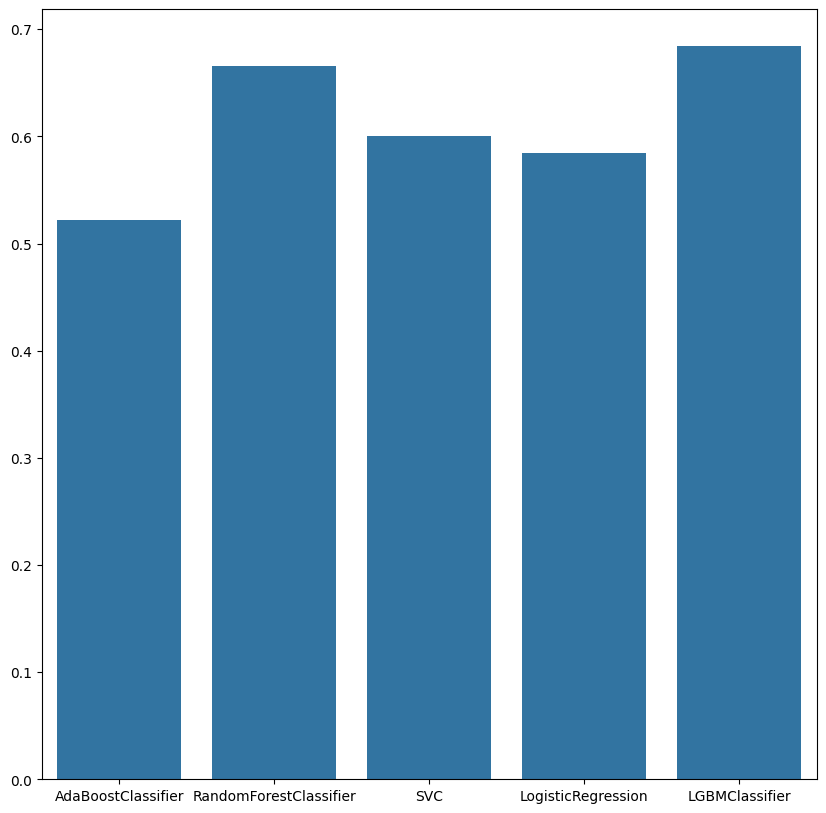

In [245]:

plt.figure(figsize=(10, 10))
sns.barplot(y=acc_list,x=model_names)

DEGRATION OF 3 CLASS CLASSIFICATION (TARGET BINNING)

#TODO